Check if I have required Data

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import ast
from sklearn.metrics import accuracy_score
import copy
from sklearn.metrics import (roc_auc_score, precision_score, recall_score, f1_score,average_precision_score)
from sklearn.neural_network import MLPClassifier
from IPython.display import Image, display
from IPython.display import Image
import PIL.Image

In [5]:
path = "D:\\Research"

In [7]:
artnet_2024 = pd.read_excel(f"{path}\\Creativity_Artnet\\Datasets\\ArtNet\\Artnet_Europe_2024_merged.xlsx")

In [8]:
Renior = artnet_2024[artnet_2024["artist"]=="Pierre-Auguste Renoir"]

In [9]:
Renior

,artwork id,artist id,first,last,nationality,year born,year died,title,workyear modifier,workyear from,workyear to,est lo usd,est hi usd,sale price usd,artist,price
6,41,14139,Pierre-Auguste,Renoir,French,1841,1919,Baigneuse,NaN,1888,1888.0,1.000000e+07,1.500000e+07,2.090250e+07,Pierre-Auguste Renoir,4.085286e+07
15,62,14139,Pierre-Auguste,Renoir,French,1841,1919,"Femme au peplum rouge, tête, bras",NaN,1895,NaN,8.695652e+04,1.217391e+05,1.920000e+05,Pierre-Auguste Renoir,2.987514e+05
29,149,14139,Pierre-Auguste,Renoir,French,1841,1919,Saule au bord d'une mare,CIRCA,1874,NaN,7.906674e+04,1.143112e+05,1.060334e+05,Pierre-Auguste Renoir,1.362007e+05
107,628,14139,Pierre-Auguste,Renoir,French,1841,1919,Compotier de fruits,CIRCA,1890,NaN,2.500000e+05,3.500000e+05,5.065000e+05,Pierre-Auguste Renoir,7.405878e+05
164,1184,14139,Pierre-Auguste,Renoir,French,1841,1919,Paysage,NaN,1917,NaN,8.150599e+04,1.191084e+05,9.526623e+04,Pierre-Auguste Renoir,1.367884e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355140,444330518,14139,Pierre-Auguste,Renoir,French,1841,1919,卡涅斯风景,NaN,1900,NaN,2.748952e+05,4.123428e+05,4.109683e+05,Pierre-Auguste Renoir,4.109683e+05
355282,444378044,14139,Pierre-Auguste,Renoir,French,1841,1919,Sur la plage à Bernval,CIRCA,1892,NaN,6.303183e+02,6.303183e+02,6.303183e+02,Pierre-Auguste Renoir,6.303183e+02
355408,444486964,14139,Pierre-Auguste,Renoir,French,1841,1919,Une Mère et Enfants,CIRCA,1912,NaN,6.000000e+02,9.000000e+02,3.250000e+02,Pierre-Auguste Renoir,3.250000e+02
355458,444878391,14139,Pierre-Auguste,Renoir,French,1841,1919,"Baigneuse debout, à mi-jambes",NaN,1910,NaN,4.760897e+02,4.760897e+02,4.760897e+02,Pierre-Auguste Renoir,4.760897e+02


In [12]:
potential_image_id=[]
for i in range(Renior.shape[0]):
    if "Femme nue" in Renior.iloc[i]["title"]:
        potential_image_id.append(Renior.iloc[i]["artwork id"])

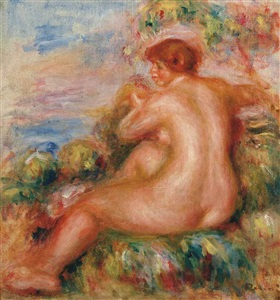

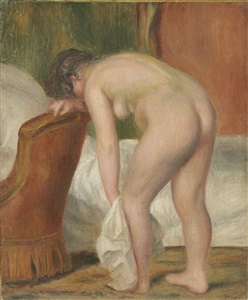

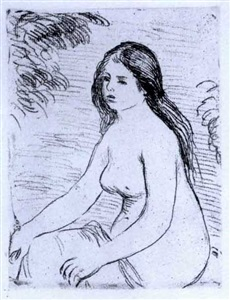

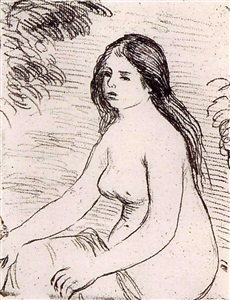

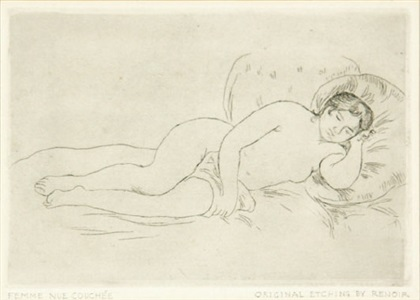

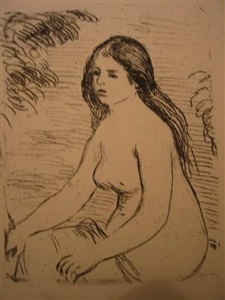

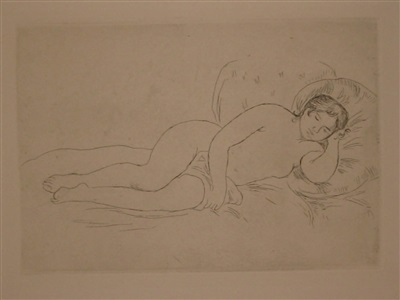

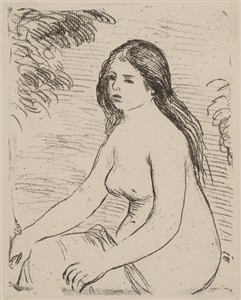

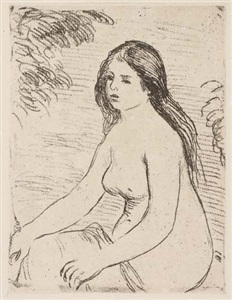

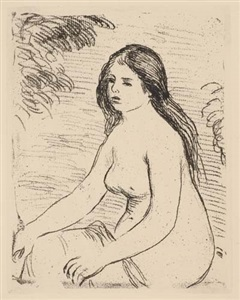

In [18]:
for i in potential_image_id[0:10]:
    display(Image(filename=f"{path}\\Creativity_Artnet\\Datasets\\ArtNet\\Images\\{int(i)}.jpg"))

# Load Data

In [20]:
newness = np.load(f"{path}\\Creativity_Artnet\\Datasets\\newness_2024.npy",allow_pickle=True)
surprise = np.load(f"{path}\\Creativity_Artnet\\Datasets\\surprise_2024.npy",allow_pickle=True)
value = np.load(f"{path}\\Creativity_Artnet\\Datasets\\value_2024.npy",allow_pickle=True)

In [38]:
small_df_list = artnet_2024["artwork id"].isin(potential_image_id)
small_df=artnet_2024[small_df_list]

In [41]:
newness_df_small = np.zeros(small_df.shape[0], dtype=object)
surprise_df_small= np.zeros(small_df.shape[0], dtype=object)
value_df_small = np.zeros(small_df.shape[0], dtype=object)
for i in range(small_df.shape[0]):
    row_index = small_df.index[i]
    newness_df_small[i] =newness[row_index]
    surprise_df_small[i] =surprise[row_index]
    value_df_small[i] = value[row_index]

In [61]:
newness_min=np.min(newness_df_small)
newness_max = np.max(newness_df_small)
newness_normalized=(newness_df_small - newness_min)/(newness_max-newness_min)
surprise_min=np.min(surprise_df_small)
surprise_max = np.max(surprise_df_small)
surprise_normalized=(surprise_df_small - surprise_min)/(surprise_max-surprise_min)
value_min=np.min(value_df_small)
value_max = np.max(value_df_small)
value_normalized=(value_df_small - value_min)/(value_max-value_min)

In [62]:
sorted_index = small_df.reset_index().sort_values(by="workyear from").index

In [63]:
image_paths=[]
values=[]
for i in range(len(sorted_index)):
    row = small_df.iloc[sorted_index[i]]
    image_paths.append(f"{path}\\Creativity_Artnet\\Datasets\\ArtNet\\Images\\{int(row['artwork id'])}.jpg")
    values.append({"year":row["workyear from"],"new": newness_normalized[sorted_index[i]], "value":value_normalized[sorted_index[i]],"surprise":surprise_normalized[sorted_index[i]]})

In [64]:
n = len(image_paths)

fig, axes = plt.subplots(n, 5, figsize=(12, 3 * n))

for i in range(n):
    # Image
    img = PIL.Image.open(image_paths[i])
    axes[i, 0].imshow(img)
    axes[i, 0].axis("off")

    # Values
    for j, (k, v) in enumerate(values[i].items(), start=1):
        axes[i, j].text(
            0.5, 0.5,
            f"{k}\n{v}",
            ha="center",
            va="center",
            fontsize=12
        )
        axes[i, j].axis("off")

plt.tight_layout()
plt.show()

# Mark with Creativity

In [65]:
gold_set_70 = pd.read_excel(f"{path}\\Creativity_Artnet\\Codes\\Evaluation\\golden_set_move_creative_70.xlsx")

In [66]:
creative_70 = np.load(f"{path}\\Creativity_Artnet\\Datasets\\creativity_70_full_prob.npy",allow_pickle=True)

In [67]:
merged_df = pd.merge(gold_set_70, artnet_2024[["artwork id","artist id","year born","workyear modifier","price","artist",'est lo usd','est hi usd', 'sale price usd']], on='artwork id', how='left')

In [68]:
keep_list = merged_df["artwork id"].isin(potential_image_id)
merged_df = merged_df[keep_list]
creative_70 = creative_70[keep_list]

In [69]:
merged_df

,Unnamed: 0,artwork id,title,first,last,workyear from,nationality,artistic_value_answer_claude,artistic_value_comment_claude,creativity_answer_claude,...,embed_creative_consist,embed_overall_consist,artist id,year born,workyear modifier,price,artist,est lo usd,est hi usd,sale price usd
1156,1156,424369281,Femme nue assise,Pierre-Auguste,Renoir,1906,French,High,Renoir's fascination with women is particularl...,Yes,...,1,1,14139,1841,NaN,4818.571429,Pierre-Auguste Renoir,2000.000000,3000.00000,3000.00000
1171,1171,424615146,Femme nue assise,Pierre-Auguste,Renoir,1906,French,High,"In his later works, Renoir shifted away from d...",Yes,...,1,0,14139,1841,NaN,1711.596726,Pierre-Auguste Renoir,1800.000000,2200.00000,1100.00000
1209,1209,425233412,Femme nue (from Pages),Pierre-Auguste,Renoir,1891,French,High,"The 1891 ""Femme nue"" from Pages is an etching,...",Yes,...,1,1,14139,1841,NaN,6656.787337,Pierre-Auguste Renoir,4000.000000,6000.00000,4400.00000
1213,1213,425233430,Femme nue assise,Pierre-Auguste,Renoir,1906,French,High,Renoir's later works demonstrate his fascinati...,Yes,...,1,1,14139,1841,NaN,3025.812426,Pierre-Auguste Renoir,2500.000000,3500.00000,2000.00000
1243,1243,425713028,Femme nue assise,Pierre-Auguste,Renoir,1906,French,High,Renoir's later works shifted away from depicti...,Yes,...,1,0,14139,1841,NaN,6643.761768,Pierre-Auguste Renoir,2000.000000,3000.00000,4560.00000
1266,1266,426591065,Femme nue assise,Pierre-Auguste,Renoir,1906,French,High,Renoir's later work shifted away from depictio...,Yes,...,1,1,14139,1841,CIRCA,2109.474764,Pierre-Auguste Renoir,1319.043693,1978.56554,1442.70404


In [70]:
creative_70

array([0.8933416 , 0.90806333, 0.96876185, 0.9681938 , 0.90729751,
       0.87951267])

In [71]:
newness_df = np.zeros(merged_df.shape[0], dtype=object)
surprise_df = np.zeros(merged_df.shape[0], dtype=object)
value_df = np.zeros(merged_df.shape[0], dtype=object)
for i in range(merged_df.shape[0]):
    row_index = merged_df.index[i]
    newness_df[i] =newness[row_index]
    surprise_df[i] =surprise[row_index]
    value_df[i] = value[row_index]

In [ ]:
image_paths=[]
values=[]
for i in range(len(sorted_index)):
    row = small_df.iloc[sorted_index[i]]
    image_paths.append(f"{path}\\Creativity_Artnet\\Datasets\\ArtNet\\Images\\{int(row['artwork id'])}.jpg")
    values.append({"year":row["workyear from"],"new": newness_normalized[sorted_index[i]], "value":value_normalized[sorted_index[i]],"surprise":surprise_normalized[sorted_index[i]]})